In [1]:
import sys, os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")  # silence warnings
import pandas as pd
from datetime import datetime,date
from causalnex.structure import StructureModel
from causalnex.plots import plot_structure, NODE_STYLE, EDGE_STYLE
from causalnex.network import BayesianNetwork
from causalnex.structure.notears import from_pandas
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import Normalizer, MinMaxScaler, StandardScaler
import matplotlib.pyplot as plt
from IPython.display import Image
# import plotly.express as px
import pickle
import matplotlib
matplotlib.style.use('fivethirtyeight')
%matplotlib inline
sys.path.append(sys.path.append)
sys.path.insert(0,'../scripts/')
from utils import label_encoder
from data_cleaning import DataCleaning
cleaner = DataCleaning()

DataCleaning module
Dataset Clearning Module


In [1]:
# import dvc.api as DvcApi
# path = "data/data/driver_locations_during_request.csv"
# repo = "../"
# # version = "v1"
# remote = "dvc-remote"

# data_url = DvcApi.get_url(path = path, repo = repo, rev = None,remote= remote) 
# data = pd.read_csv(data_url)

In [50]:
df_clean=pd.read_csv('../data/df_cleaned_final.csv')

In [53]:
sample_df= df_clean.sample(500)

In [54]:
df_trip_origin_500=cleaner.reverse_location(sample_df)

The sample of the dataset shows that no holidays.

In [62]:
df_trip_origin_500.holiday.value_counts()

False    500
Name: holiday, dtype: int64

In [55]:
df_cleaned_500=df_trip_origin_500.copy()

In [56]:
df_cleaned_500.head(1)

,order_id,driver_id,driver_action,Trip Start Time,Trip End Time,Trip_Origin_lat,Trip_Origin_lng,Trip_Destination_lat,Trip_Destination_lng,Date,...,Day,WeekOfYear,Day of Week,Is Weekend,dayofweek,Duration_Minutes,distance,Speed_km/min,holiday,location
393237,406976,243918,rejected,2021-07-03 10:04:54,2021-07-03 11:59:18,6.539809,3.362953,6.530923,3.302111,2021-07-03 11:59:18,...,3,26,5,1,Saturday,115.0,6.793614,0.059075,False,Mushin


In [57]:
df_cleaned_500["fulfilled"] = (df_cleaned_500["driver_action"] == "accepted") & (df_cleaned_500["Duration_Minutes"] >=10)

In [58]:
df_cleaned_500["hour"]=df_cleaned_500["Trip Start Time"].apply(lambda x: pd.to_datetime(x).hour)

In [59]:
df_cleaned_500.reset_index(drop=True, inplace=True)

In [61]:
# df_cleaned_500

In [63]:
df_cleaned_500.to_csv('../data/loc_sample_df.csv',index=False)

` Label encode non numeric features`

In [2]:
df_sample= pd.read_csv('../data/loc_sample_df.csv')

In [3]:
df_sample.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   order_id              500 non-null    int64  
 1   driver_id             500 non-null    int64  
 2   driver_action         500 non-null    object 
 3   Trip Start Time       500 non-null    object 
 4   Trip End Time         500 non-null    object 
 5   Trip_Origin_lat       500 non-null    float64
 6   Trip_Origin_lng       500 non-null    float64
 7   Trip_Destination_lat  500 non-null    float64
 8   Trip_Destination_lng  500 non-null    float64
 9   Date                  500 non-null    object 
 10  Year                  500 non-null    int64  
 11  Month                 500 non-null    int64  
 12  Day                   500 non-null    int64  
 13  WeekOfYear            500 non-null    int64  
 14  Day of Week           500 non-null    int64  
 15  Is Weekend            5

<AxesSubplot:>

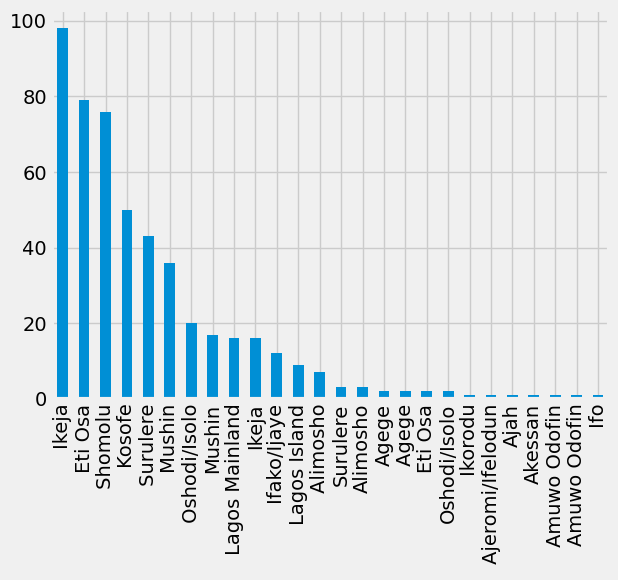

In [64]:
df_sample['location'].value_counts().plot(kind='bar')

In [6]:
df_sample.isnull().sum()

order_id                0
driver_id               0
driver_action           0
Trip Start Time         0
Trip End Time           0
Trip_Origin_lat         0
Trip_Origin_lng         0
Trip_Destination_lat    0
Trip_Destination_lng    0
Date                    0
Year                    0
Month                   0
Day                     0
WeekOfYear              0
Day of Week             0
Is Weekend              0
dayofweek               0
Duration_Minutes        0
distance                0
Speed_km/min            0
holiday                 0
location                0
fulfilled               0
hour                    0
dtype: int64

In [7]:
df_sample.describe()

,order_id,driver_id,Trip_Origin_lat,Trip_Origin_lng,Trip_Destination_lat,Trip_Destination_lng,Year,Month,Day,WeekOfYear,Day of Week,Is Weekend,Duration_Minutes,distance,Speed_km/min,hour
count,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.0,500.000000,500.0000,500.000000,500.000000,500.00000,500.000000,500.000000,500.000000,500.000000
mean,418782.802000,236018.484000,6.534978,3.382762,6.537225,3.381579,2021.0,7.002000,4.9820,26.638000,2.578000,0.11400,53.878000,8.432311,0.321204,13.350000
std,14957.975976,20790.700706,0.059623,0.054848,0.071687,0.077685,0.0,0.044721,2.5192,0.524888,1.578893,0.31813,70.442853,5.891295,0.848658,3.036105
min,392284.000000,171091.000000,6.425042,3.253713,6.422201,3.171818,2021.0,7.000000,1.0000,26.000000,0.000000,0.00000,1.000000,0.379713,0.010614,7.000000
25%,405132.750000,243081.000000,6.498526,3.350301,6.469767,3.340853,2021.0,7.000000,2.0000,26.000000,1.000000,0.00000,29.750000,4.230658,0.102880,11.000000
50%,422024.500000,243675.500000,6.537747,3.368877,6.533882,3.368538,2021.0,7.000000,6.0000,27.000000,3.000000,0.00000,41.000000,7.029589,0.159447,13.000000
75%,429815.750000,244120.000000,6.593658,3.390239,6.599883,3.398935,2021.0,7.000000,7.0000,27.000000,4.000000,0.00000,62.250000,11.268951,0.234588,16.000000
max,448477.000000,245691.000000,6.648566,3.582804,6.802627,3.893278,2021.0,8.000000,12.0000,31.000000,6.000000,1.00000,937.000000,55.654783,10.353274,21.000000


In [8]:
df_sample.head(1)

,order_id,driver_id,driver_action,Trip Start Time,Trip End Time,Trip_Origin_lat,Trip_Origin_lng,Trip_Destination_lat,Trip_Destination_lng,Date,...,Day of Week,Is Weekend,dayofweek,Duration_Minutes,distance,Speed_km/min,holiday,location,fulfilled,hour
0,406976,243918,rejected,2021-07-03 10:04:54,2021-07-03 11:59:18,6.539809,3.362953,6.530923,3.302111,2021-07-03 11:59:18,...,5,1,Saturday,115.0,6.793614,0.059075,False,Mushin,False,10


In [ ]:
col=['order_id','driver_id','driver_action', 'Trip Start Time','Trip End Time','Trip_Origin_lat','Trip_Origin_lng',
 'Trip_Destination_lat','Trip_Destination_lng','Date', 'Year','Month','Day','WeekOfYear', 'Day of Week',
 'Is Weekend','dayofweek','Duration_Minutes','distance','Speed_km/min','holiday','location','fulfilled']

In [9]:
# drop unwanted columns
unwanted_cols = ['order_id','driver_id','WeekOfYear','dayofweek','Trip Start Time','Trip End Time']
df_causal = df_sample.drop(columns=unwanted_cols)

In [10]:
df_causal.head(1)

,driver_action,Trip_Origin_lat,Trip_Origin_lng,Trip_Destination_lat,Trip_Destination_lng,Date,Year,Month,Day,Day of Week,Is Weekend,Duration_Minutes,distance,Speed_km/min,holiday,location,fulfilled,hour
0,rejected,6.539809,3.362953,6.530923,3.302111,2021-07-03 11:59:18,2021,7,3,5,1,115.0,6.793614,0.059075,False,Mushin,False,10


In [11]:
# after encording the labels are reject =1 and accepted=0
df_causal['driver_action'].value_counts()

rejected    489
accepted     11
Name: driver_action, dtype: int64

In [12]:
df_causal_num=label_encoder(df_causal)

In [10]:
# ! pip install pygraphviz

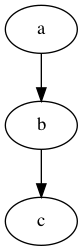

In [9]:
import pygraphviz as pgv
from IPython.display import Image

def draw(dot):
    return Image(pgv.AGraph(dot).draw(format='png', prog='dot'))

g1 = """digraph top {
   a -> b -> c;
}"""
draw(g1)

In [13]:
df_causal_num.head(1)

,driver_action,Trip_Origin_lat,Trip_Origin_lng,Trip_Destination_lat,Trip_Destination_lng,Date,Year,Month,Day,Day of Week,Is Weekend,Duration_Minutes,distance,Speed_km/min,holiday,location,fulfilled,hour
0,1,6.539809,3.362953,6.530923,3.302111,136,2021,7,3,5,1,115.0,6.793614,0.059075,0,11,0,10


In [14]:
# create kmeans model/object
kmeans = KMeans(
    init="random",
    n_clusters=20,
    n_init=10,
    max_iter=300,
    random_state=42
)

In [247]:
driver_loc=df_causal_num[["Trip_Destination_lat","Trip_Destination_lng"]]
request_loc=df_causal_num[["Trip_Origin_lat","Trip_Origin_lng"]]
# driver_loc

In [19]:
# do clustering
kmeans.fit(driver_loc)
# save results
driver_labels = kmeans.labels_
# driver_labels

In [20]:
# do clustering
kmeans.fit(request_loc)
# save results
request_labels = kmeans.labels_

`add clusters to the dataframe ` 

In [21]:
df_causal_num["driver_loc"]=driver_labels
df_causal_num["request_loc"]=request_labels

In [22]:
df_causal_num.head(1)

,driver_action,Trip_Origin_lat,Trip_Origin_lng,Trip_Destination_lat,Trip_Destination_lng,Date,Year,Month,Day,Day of Week,Is Weekend,Duration_Minutes,distance,Speed_km/min,holiday,location,fulfilled,hour,driver_loc,request_loc
0,1,6.539809,3.362953,6.530923,3.302111,136,2021,7,3,5,1,115.0,6.793614,0.059075,0,11,0,10,11,17


In [23]:
df_causal_fin= df_causal_num.copy()

Drop other unwanted columns

In [24]:
df_causal_fin.drop(columns=["Trip_Origin_lat","Trip_Origin_lng","Trip_Destination_lat","Trip_Destination_lng"],
                           inplace=True)
# df.rename(columns={"driver_id":"driver"},inplace=True)

In [25]:
# make a copy of dataframe
num_features = df_causal_fin.copy()

col_names = ['Duration_Minutes', 'distance']
features = num_features[col_names]

# Use scaler of choice; here Standard scaler is used
scaler = MinMaxScaler().fit(features.values)
features = scaler.transform(features.values)

num_features[col_names] = features

df = num_features.copy()

In [26]:
sm = StructureModel()

In [84]:
sm_scaled= from_pandas(df)

In [91]:
sm_enh_scaled = from_pandas(df, tabu_edges=[("distance","driver_loc")],
                              tabu_parent_nodes=["driver_action"],
                              tabu_child_nodes=["Date","hour"], w_threshold=0.7)


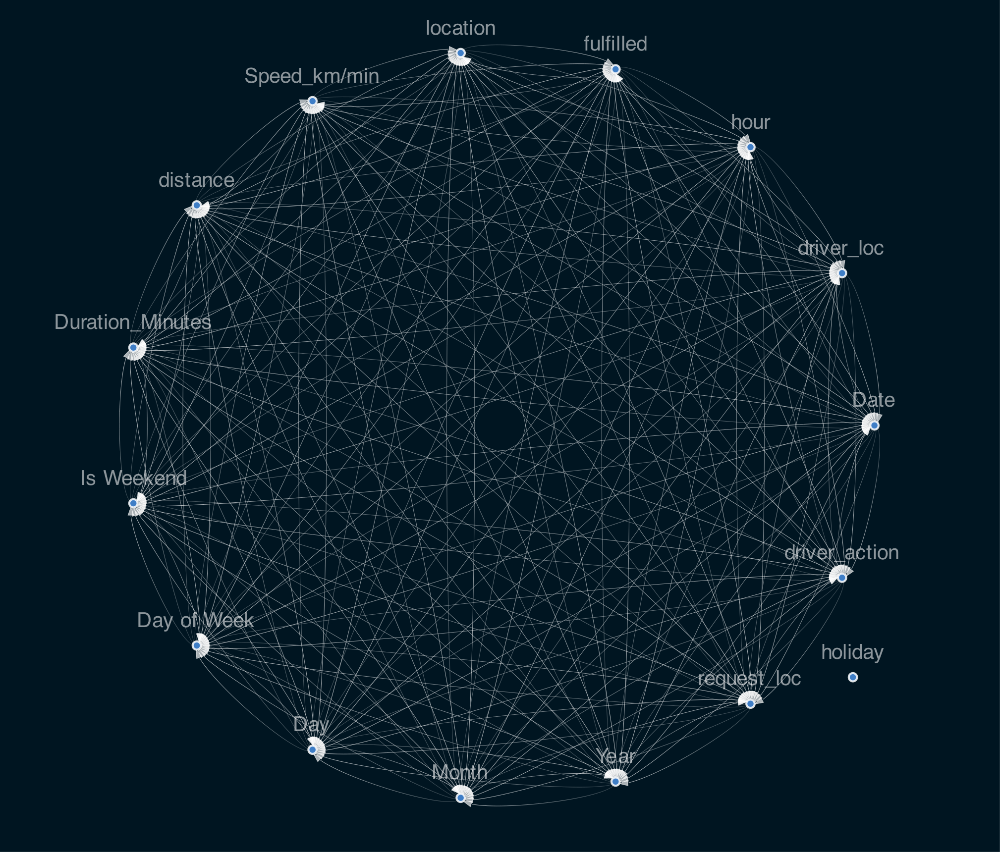

In [93]:
from IPython.display import Image

viz = plot_structure(
    sm_scaled,
    graph_attributes={"scale": "0.9"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)
filename = "./structure_model.png"
viz.draw(filename)
Image(viz.draw(
    format="png", prog="circo"  # `circo` produces a circular layout
),width=500)

Remove Edges below certain threshold to identify the important causal features

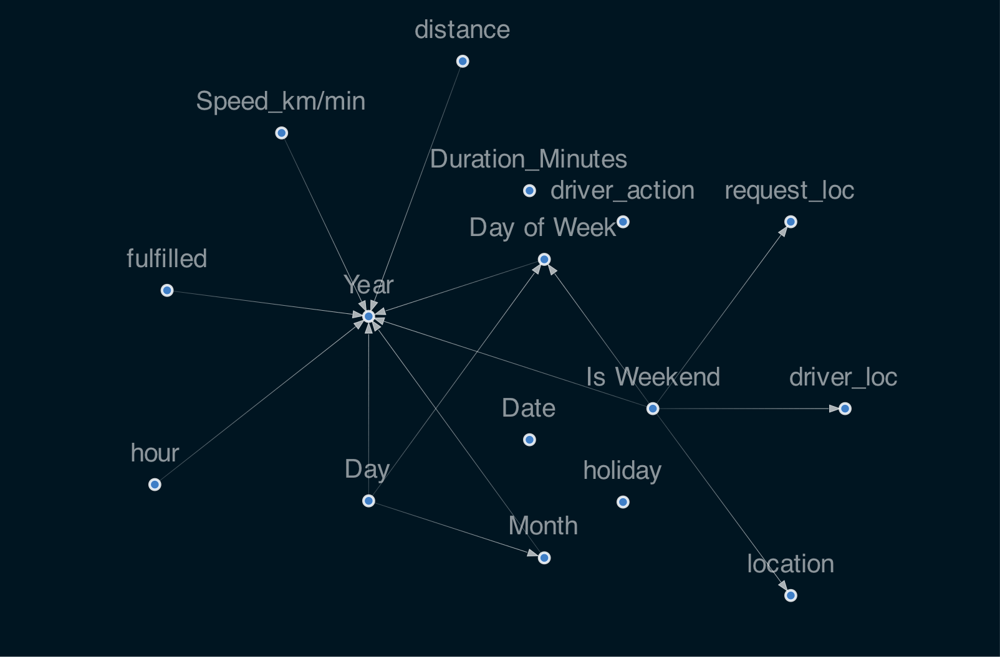

In [94]:
viz = plot_structure(
    sm_enh_scaled,
    graph_attributes={"scale": "0.9"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)
filename = "./structure_model.png"
viz.draw(filename)
Image(viz.draw(
    format="png", prog="circo"  # `circo` produces a circular layout
),width=500)

`From the above DAG, we can see some correct and incorrect relations.`

In [108]:
sm_enh_scaled.add_edge("distance", "driver_action")
sm_enh_scaled.add_edge("date", "driver_action")
sm_enh_scaled.add_edge("date", "holiday")
sm_enh_scaled.add_edge("hour", "driver_action")
sm_enh_scaled.add_edge("request_loc", "distance")
sm_enh_scaled.add_edge("driver_loc", "distance")
sm_enh_scaled.add_edge("distance", "driver_action")
sm_enh_scaled.add_edge("Duration_Minutes", "driver_action")
sm_enh_scaled.add_edge("distance", "fulfilled")
sm_enh_scaled.add_edge("fulfilled", 'Date')
sm_enh_scaled.add_edge('Speed_km/min',"fulfilled")

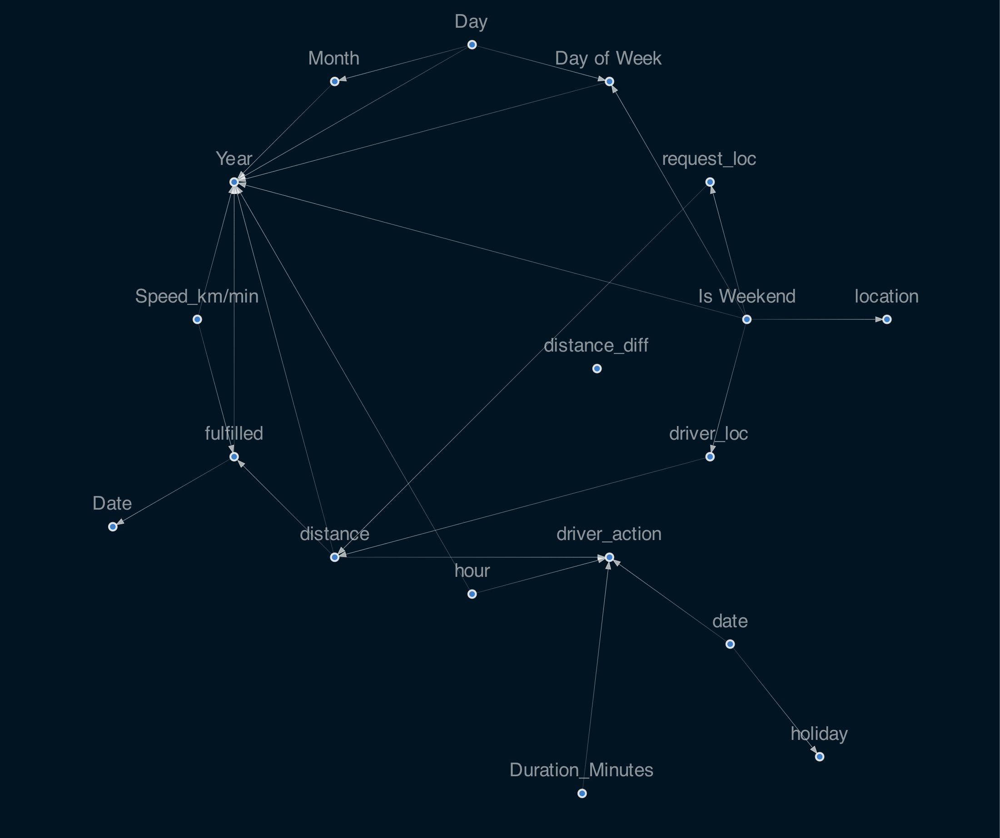

In [109]:
viz = plot_structure(
    sm_enh_scaled,
    graph_attributes={"scale": "0.5"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)
filename = "./structure_model.png"
viz.draw(filename)
Image(viz.draw(
    format="png", prog="circo"  # `circo` produces a circular layout
),width=500)

From the above DAG, we can see many correct and incorrect relations.

- For Example

  - Correct Relations
    - Speed_km/min => duration
    - distance => duration
    - distance => fulfilled
    - Holiday => isWeekend
      
  - Incorrect Relations
    -  Speed_km/min  => Year
    - distance  => Year
- With more runs the graph has been updated

`remove unrelated egdes`
- `logical modifications `

In [113]:
sm_enh_scaled.remove_edge("Speed_km/min", "Year")
sm_enh_scaled.remove_edge("Year", "Month")
# sm_enh_scaled.remove_edge("Speed_km/min", "Is Weekend")


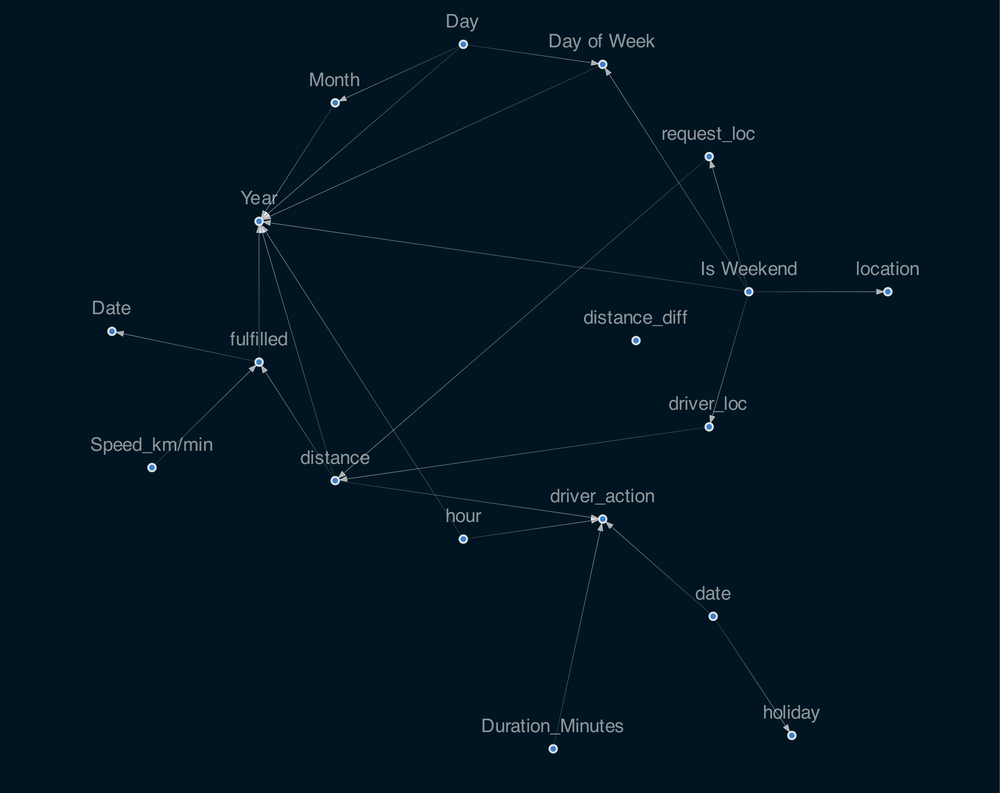

In [114]:
viz = plot_structure(
    sm_enh_scaled,
    graph_attributes={"scale": "0.5"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)
filename = "./structure_model.png"
viz.draw(filename)
Image(viz.draw(
    format="png", prog="circo"  # `circo` produces a circular layout
),width=500)

`Use the whole cleaned dataset`

In [29]:
df_causal_fin.head(1)

,driver_action,Date,Year,Month,Day,Day of Week,Is Weekend,Duration_Minutes,distance,Speed_km/min,holiday,location,fulfilled,hour,driver_loc,request_loc
0,1,136,2021,7,3,5,1,115.0,6.793614,0.059075,0,11,0,10,11,17


In [34]:
df_causal_fin.columns


Index(['driver_action', 'Date', 'Year', 'Month', 'Day', 'Day of Week',
       'Is Weekend', 'Duration_Minutes', 'distance', 'Speed_km/min', 'holiday',
       'location', 'fulfilled', 'hour', 'driver_loc', 'request_loc'],
      dtype='object')

`drop unwanted columns`

In [35]:
df_causal_fin.drop(columns=['Date','Year','Day'],inplace=True)

In [39]:
df_causal_fin.drop(columns=['location'],inplace=True)

In [292]:
df_causal_fin.rename(columns = {'Day of Week':'DayofWeek', 'Is Weekend':'IsWeekend'}, 
                        inplace = True)


In [294]:
df_causal_fin.drop(columns=['Speed_km/min'],inplace=True)

In [295]:
sm_fin= from_pandas(df_causal_fin)

In [296]:
no_edges=[("fulfilled","Duration_Minutes"),("fulfilled","driver_loc"),
("driver_action","driver_loc"),("driver_action","distance"),("driver_action","Duration_Minutes")]
sm_fin_enh = from_pandas(df_causal_fin,tabu_child_nodes=["Month","DayofWeek","hour"])

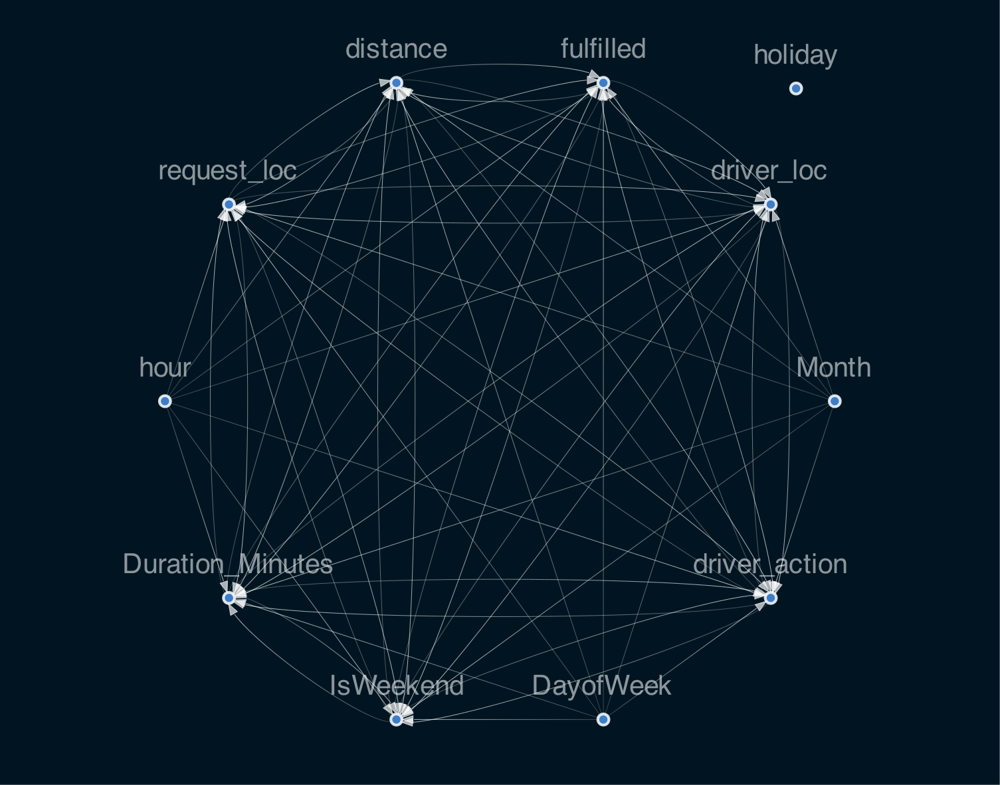

In [297]:
viz = plot_structure(
    sm_fin_enh,
    graph_attributes={"scale": "0.8"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK,
    prog="circo"
)
Image(viz.draw(format='png'))

`remove ages below a certain threshold`

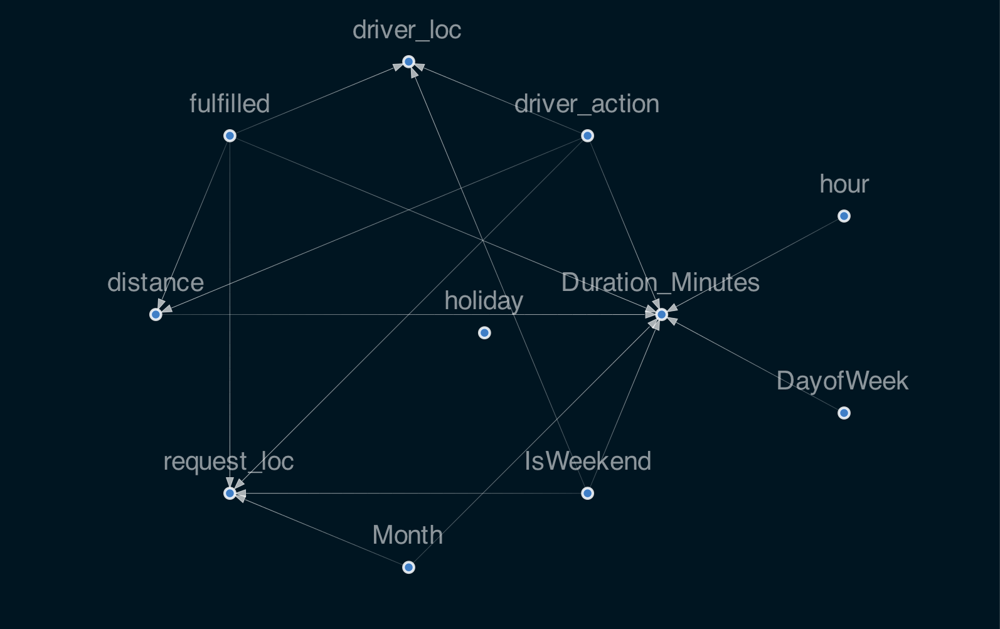

In [298]:
sm_fin_enh.remove_edges_below_threshold(0.9)
viz = plot_structure(
    sm_fin_enh,
    graph_attributes={"scale": "0.8"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)
filename = "./structure_model_clean_df.png"
viz.draw(filename)
Image(viz.draw(
    format="png", prog="circo"  # `circo` produces a circular layout
),width=500)

In [301]:
sm_fin_enh.remove_edge("fulfilled","driver_loc")

Index(['driver_action', 'Date', 'Year', 'Month', 'Day', 'Day of Week',
       'Is Weekend', 'Duration_Minutes', 'distance', 'Speed_km/min', 'holiday',
       'location', 'fulfilled', 'hour', 'driver_loc', 'request_loc'],
      dtype='object')

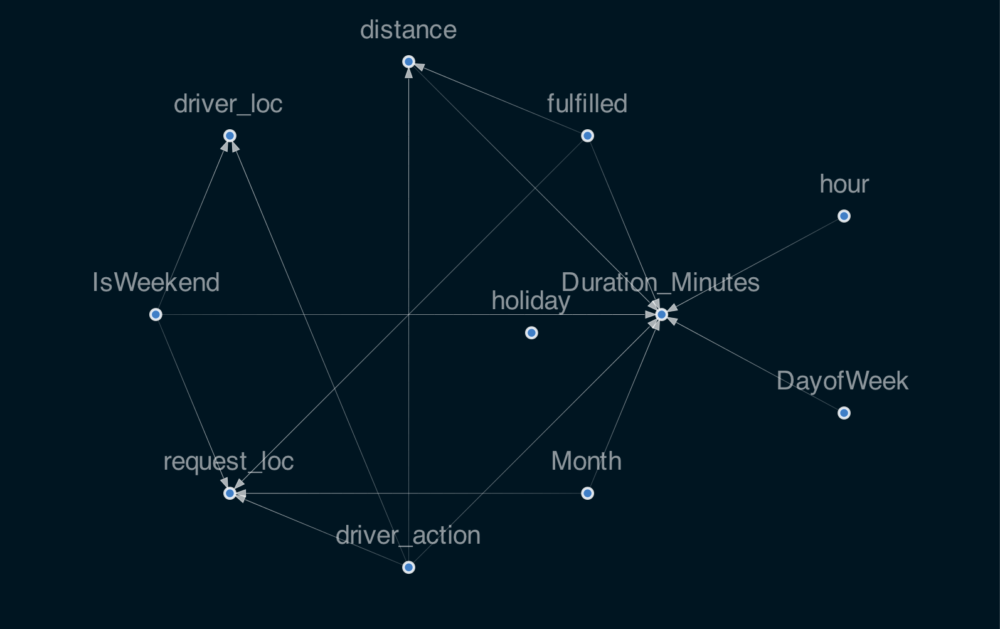

In [302]:
viz = plot_structure(
    sm_fin_enh,
    graph_attributes={"scale": "0.8"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)
filename = "./structure_model_clean_df.png"
viz.draw(filename)
Image(viz.draw(
    format="png", prog="circo"  # `circo` produces a circular layout
),width=500)

`remove unrelated egdes`
- `logical modifications `

In [303]:
sm_fin_enh.remove_edge("driver_action","Duration_Minutes")

In [305]:
sm_fin_enh.remove_edge("fulfilled","distance")

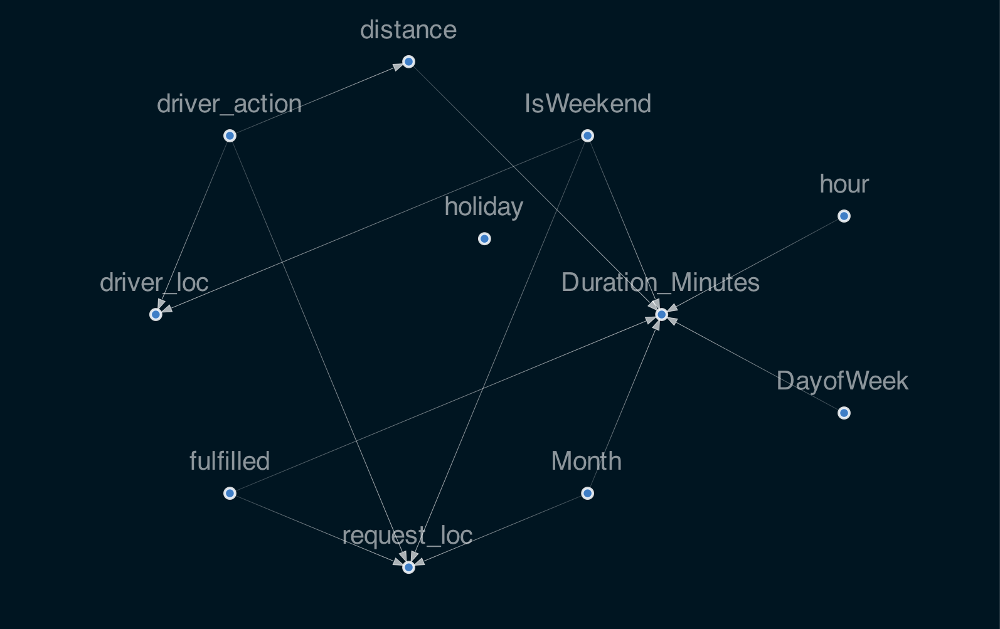

In [306]:
viz = plot_structure(
    sm_fin_enh,
    graph_attributes={"scale": "0.8"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)
filename = "./structure_model_clean_df.png"
viz.draw(filename)
Image(viz.draw(
    format="png", prog="circo"  # `circo` produces a circular layout
),width=500)

`Add some egdes`

In [307]:
sm_fin_enh.add_edge( "driver_action","fulfilled")
sm_fin_enh.add_edge("hour", "driver_action")
sm_fin_enh.add_edge("request_loc", "distance")
# sm_fin_enh.add_edge("fulfilled", "request_loc")
sm_fin_enh.add_edge("holiday", "driver_loc")

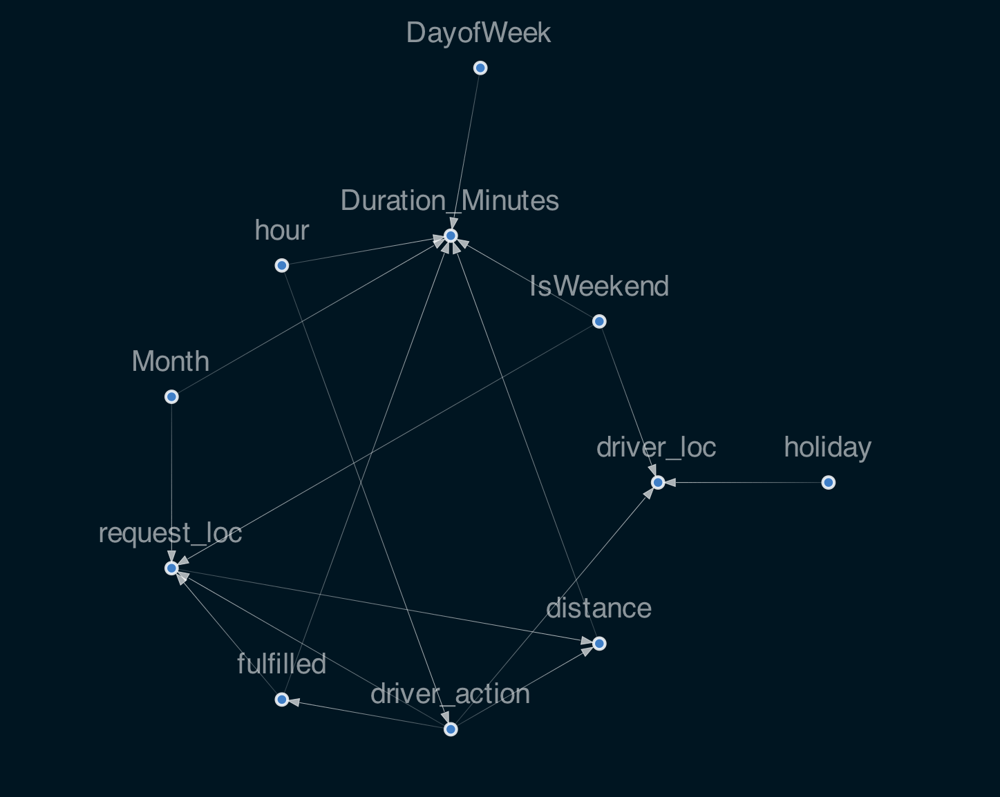

In [308]:
viz = plot_structure(
    sm_fin_enh,
    graph_attributes={"scale": "0.8"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)
filename = "./structure_model_clean_df.png"
viz.draw(filename)
Image(viz.draw(
    format="png", prog="circo"  # `circo` produces a circular layout
),width=500)

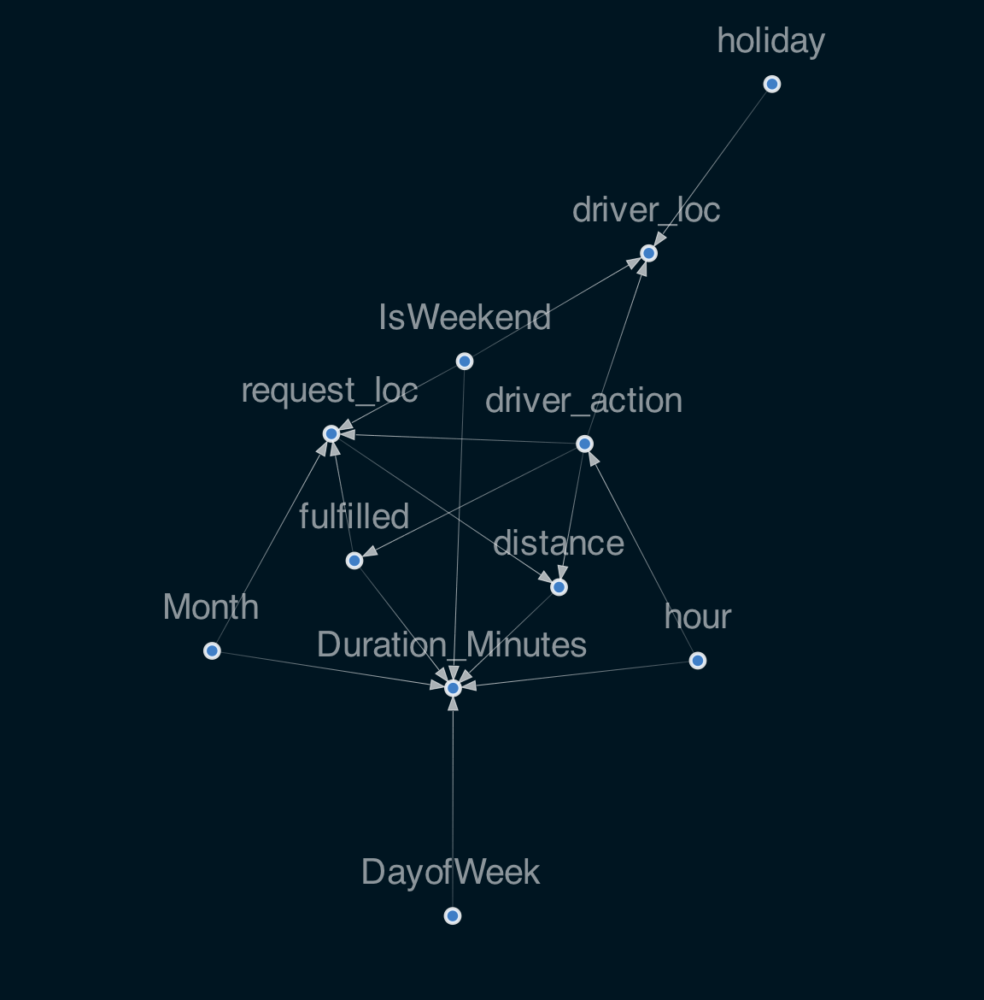

In [309]:
sm_enhanced = sm_fin_enh.get_largest_subgraph()
viz = plot_structure(
    sm_fin_enh,
    graph_attributes={"scale": "0.8"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)
# filename = "./structure_model_clean_df.png"
viz.draw(filename)
Image(viz.draw(
    format="png",# prog="circo"  # `circo` produces a circular layout
),width=500)

In [310]:
bn = BayesianNetwork(sm_enhanced)

`Normalize`

In [ ]:
def normalizer(df,columns) -> pd.DataFrame:
    """
    Returns dataframe with normalized columns
    """
    nrm = Normalizer()
    df_norm = df.copy(deep=True)
    df_norm[columns] = pd.DataFrame(
        nrm.fit_transform( df_norm[columns]), columns=columns
    )
    return df_norm

In [ ]:
# df_causal_norm = normalizer(df_causal,columns=['Duration_Minutes','distance''])

In [312]:
df_causal_fin.distance.min()

0.3797134195108889

In [313]:
df_causal_fin.distance.max()

55.654782723266806

In [315]:
df_causal_fin['DayofWeek'].value_counts()

3    109
1    103
4     98
2     84
0     49
5     43
6     14
Name: DayofWeek, dtype: int64

In [199]:
df_causal_fin.dtypes

driver_action         int64
Month                 int64
Day of Week           int64
Is Weekend            int64
Duration_Minutes    float64
distance            float64
Speed_km/min        float64
holiday               int64
fulfilled             int64
hour                  int64
driver_loc            int32
request_loc           int32
dtype: object

`Preparing the Discret Data`

In [356]:
from causalnex.discretiser import Discretiser

discr_data = df_causal_fin.copy()

discr_data["Duration_Minutes"] = Discretiser(method="fixed",
                          numeric_split_points=[10]).transform(discr_data["Duration_Minutes"].values)
discr_data["distance"] = Discretiser(method="fixed",
                          numeric_split_points=[5]).transform(discr_data["distance"].values)
discr_data["Month"] = Discretiser(method="fixed",
                          numeric_split_points=[4,8]).transform(discr_data["Month"].values)
discr_data["DayofWeek"] = Discretiser(method="fixed",
                          numeric_split_points=[0,1,2,3,4,5,6]).transform(discr_data["DayofWeek"].values)
discr_data["hour"] = Discretiser(method="fixed",
                          numeric_split_points=[8,16]).transform(discr_data["hour"].values)
discr_data["request_loc"] = Discretiser(method="fixed",
                          numeric_split_points=[5,10,15,20]).transform(discr_data["request_loc"].values)
discr_data['driver_loc'] = Discretiser(method="fixed",
                          numeric_split_points=[5,10,15,20]).transform(discr_data['driver_loc'].values)


In [317]:
df_causal_fin['driver_loc'].value_counts()

9     55
4     50
10    38
1     37
0     36
13    35
16    34
2     30
11    27
14    25
19    22
15    22
6     19
17    18
7     14
8     13
12    13
18     7
5      3
3      2
Name: driver_loc, dtype: int64

<AxesSubplot:>

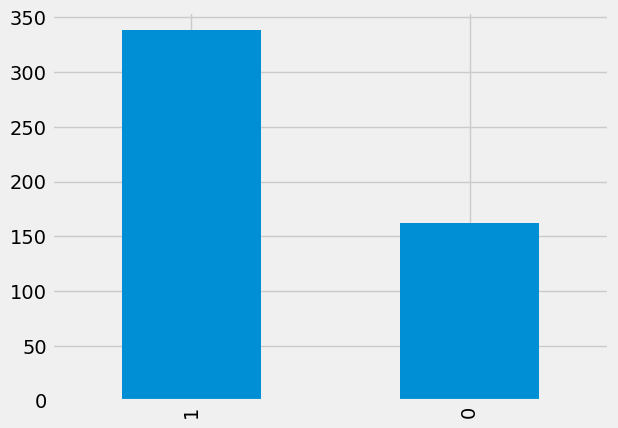

In [318]:
discr_data["distance"].value_counts().plot(kind='bar')

In [319]:
discr_data.columns

Index(['driver_action', 'Month', 'DayofWeek', 'IsWeekend', 'Duration_Minutes',
       'distance', 'holiday', 'fulfilled', 'hour', 'driver_loc',
       'request_loc'],
      dtype='object')

In [357]:
discr_data['driver_loc'].value_counts()

0    155
2    138
1    104
3    103
Name: driver_loc, dtype: int64

`Creating Labels for the Numerical Features`

In [358]:
map_fulfilled = {0: "no", 1: "yes"}
map_holiday = {0: "no"}
map_weekend = {0: "no", 1: "yes"}
map_diver_action = {0: "accepted", 1: "rejected"}
map_hour = {0:"early",1:"working_hour",2:"late"}
map_distance = {0:"near",1:"far"}
map_duration = {0:"short",1:"valid"}
map_month={1:'First_quarter',2:'Second_quarter'}
map_day_of_week={1: 'Sunday',2:'Monday',3: 'Tuesday',4:'Wednesday', 
                        5: 'Thursday',	6:'Friday',	7:'Saturday'}
map_driver_loc={0:'near',1:'medium',2:'far',3:'very_far'}
map_request_loc={0:'near',1:'medium',2:'far',3:'very_far'}


discr_data["fulfilled"] = discr_data["fulfilled"].map(map_fulfilled)
discr_data["holiday"] = discr_data["holiday"].map(map_holiday)
discr_data["IsWeekend"] = discr_data["IsWeekend"].map(map_weekend)
discr_data["driver_action"] = discr_data["driver_action"].map(map_diver_action)
discr_data["hour"] = discr_data["hour"].map(map_hour)
discr_data["distance"] = discr_data["distance"].map(map_distance)
discr_data["Duration_Minutes"] = discr_data["Duration_Minutes"].map(map_duration)
discr_data['Month']=discr_data['Month'].map(map_month)
discr_data['DayofWeek']=discr_data['DayofWeek'].map(map_day_of_week)
discr_data['driver_loc']= discr_data['driver_loc'].map(map_driver_loc)
discr_data["request_loc"]=discr_data["request_loc"].map(map_request_loc)

`rename some columns`

In [360]:
discr_data_final= discr_data.copy()

In [354]:
# discr_data_final.drop(columns='Speed_km/min',inplace=True)

In [359]:
discr_data.head()

,driver_action,Month,DayofWeek,IsWeekend,Duration_Minutes,distance,holiday,fulfilled,hour,driver_loc,request_loc
0,rejected,First_quarter,Friday,yes,valid,far,no,no,working_hour,far,very_far
1,rejected,First_quarter,Tuesday,no,valid,far,no,no,working_hour,medium,far
2,rejected,First_quarter,Wednesday,no,valid,far,no,no,working_hour,near,medium
3,rejected,First_quarter,Friday,yes,valid,far,no,no,working_hour,very_far,very_far
4,rejected,First_quarter,Monday,no,valid,far,no,no,late,very_far,near


In [287]:
# discr_data['request_loc'].value_counts()

`split the data into train/test set`

In [361]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(discr_data, train_size=0.9, test_size=0.1, random_state=7)

In [362]:
bn = bn.fit_node_states(discr_data)

In [363]:
bn = bn.fit_cpds(train, method="BayesianEstimator", bayes_prior="K2")

In [364]:
bn.cpds["driver_action"]

hour,early,late,working_hour
driver_action,,,
accepted,0.25,0.033333,0.027108
rejected,0.75,0.966667,0.972892


In [365]:
bn.cpds["fulfilled"]

driver_action,accepted,rejected
fulfilled,,
no,0.153846,0.997732
yes,0.846154,0.002268


In [369]:
discr_data.loc[18, discr_data.columns != 'fulfilled']

driver_action            rejected
Month               First_quarter
DayofWeek                  Sunday
IsWeekend                      no
Duration_Minutes            valid
distance                     near
holiday                        no
hour                 working_hour
driver_loc                   near
request_loc              very_far
Name: 18, dtype: object

In [370]:
predictions = bn.predict(discr_data, "fulfilled")

In [371]:
print(f"The prediction is '{predictions.loc[18, 'fulfilled_prediction']}'")

The prediction is 'no'


In [372]:
print(f"The ground truth is '{discr_data.loc[18, 'fulfilled']}'")

The ground truth is 'no'


### Area Under the Curve
Receiver Operating Characteristics (ROC), and the Area Under the ROC Curve (AUC) can be obtained using the roc_auc method within the CausalNex metrics module. Again, a test set and target node must be provided. The ROC curve is computed by micro-averaging predictions made across all states (classes) of the target node.

In [379]:
from causalnex.evaluation import roc_auc
roc, auc = roc_auc(bn, test, "fulfilled")
print(auc)
# We have a high area under the curve, so along with the high f1 and recall scores
# we can conclude the model is not overfitting but performing good.

1.0


### Querying Marginals
After iterating over our model structure, CPDs, and validating our model quality, we can query our model under different observations to gain insights.

### Baseline Marginals
To query the model for baseline marginals that reflect the population as a whole, a query method can be used. First let’s update our model using the complete dataset, since the one we currently have was only built from training data.

Querying

In [374]:
# For inference, we must create a new InferenceEngine from our BayesianNetwork, which lets us query the model. 
# The query method will compute the marginal likelihood of all states for all nodes.

from causalnex.inference import InferenceEngine

ie = InferenceEngine(bn)
marginals = ie.query()
marginals["fulfilled"]

{'no': 0.9722303727303866, 'yes': 0.027769627269613986}

In [375]:
import numpy as np

labels, counts = np.unique(discr_data["fulfilled"], return_counts=True)
list(zip(labels, counts))

[('no', 490), ('yes', 10)]

Marginal observations

In [377]:
marginals_short = ie.query({"distance": "near"})
marginals_long = ie.query({"distance": "far"})
print("Marginal driver_action | near distance", marginals_short["driver_action"])
print("Marginal driver_action | far distance", marginals_long["driver_action"])

Marginal driver_action | near distance {'accepted': 0.03321380642184748, 'rejected': 0.9667861935781524}
Marginal driver_action | far distance {'accepted': 0.028730426246597794, 'rejected': 0.9712695737534023}


### Evaluate Models performance
#### Classification Report
To obtain a classification report using a BN, we need to provide a test set, and the node we are trying to classify. The report will predict the target node for all rows in the test set, and evaluate how well those predictions are made

In [378]:
from causalnex.evaluation import classification_report

classification_report(bn, test, "fulfilled")

{'fulfilled_no': {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 50},
 'fulfilled_yes': {'precision': 0.0,
  'recall': 0.0,
  'f1-score': 0.0,
  'support': 0},
 'micro avg': {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 50},
 'macro avg': {'precision': 0.5,
  'recall': 0.5,
  'f1-score': 0.5,
  'support': 50},
 'weighted avg': {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 50}}

DoCalculus

In [380]:
# testing do calculus before getting to action 

print("distribution before do", ie.query()["fulfilled"])
ie.do_intervention("fulfilled",
                   {'yes': 1.0,
                    'no': 0.0})
print("distribution after do", ie.query()["fulfilled"])

distribution before do {'no': 0.9722303727303866, 'yes': 0.027769627269613986}
distribution after do {'no': 0.0, 'yes': 0.9999999999999997}


In [381]:
ie.reset_do("fulfilled")

In [384]:
# what if all drivers were in 5km of the request

print("marginal fulfilled", ie.query()["fulfilled"])
ie.do_intervention("distance",
                   {'near': 1.0,
                    'far': 0.0})
print("updated marginal fulfilled", ie.query()["fulfilled"])
ie.reset_do("distance")

marginal fulfilled {'no': 0.9722303727303858, 'yes': 0.027769627269613968}
updated marginal fulfilled {'no': 0.9722303727303858, 'yes': 0.027769627269613968}


In [385]:
# what if all drivers were in 5km of the request

print("marginal action", ie.query()["driver_action"])
ie.do_intervention("distance",
                   {'near': 1.0,
                    'far': 0.0})
print("updated marginal actions", ie.query()["driver_action"])
ie.reset_do("distance")

marginal action {'accepted': 0.030219775348635153, 'rejected': 0.9697802246513652}
updated marginal actions {'accepted': 0.030219775348635146, 'rejected': 0.969780224651365}


If we have all the drivers in less that 5km of the requests, we would have seen a slight decrease in fulfillment
Though we will have more drivers accepting the requests

In [387]:
print("marginal fulfilled", ie.query()["Duration_Minutes"])

marginal fulfilled {'short': 0.17803524023499706, 'valid': 0.8219647597650025}


In [391]:
print("marginal fulfilled", ie.query()["fulfilled"])
ie.do_intervention("distance",
                   {'near': 1.0,
                    'far': 0.0})
# ie.do_intervention("Duration_Minutes",
#                    {'valid': 1.0,
#                     'short': 0.0})
# print("updated marginal fulfilled", ie.query()["fulfilled"])
# ie.reset_do("distance")
# ie.reset_do("Duration_Minutes")

marginal fulfilled {'no': 0.9722303727303858, 'yes': 0.027769627269613968}


In [392]:
print("marginal actions", ie.query()["driver_action"])
ie.do_intervention("hour",
                   {'early': 1.0,
                    'late': 0.0,
                    'working_hour': 0.0})
print("updated marginal actionons", ie.query()["driver_action"])

ie.reset_do("hour")

marginal actions {'accepted': 0.030219775348635146, 'rejected': 0.969780224651365}
updated marginal actionons {'accepted': 0.25, 'rejected': 0.7500000000000003}


In [393]:
print("marginal actions", ie.query()["driver_action"])
ie.do_intervention("hour",
                   {'early': 0.0,
                    'late': 1.0,
                    'working_hour': 0.0})
print("updated marginal actionons", ie.query()["driver_action"])

ie.reset_do("hour")

marginal actions {'accepted': 0.030219775348635153, 'rejected': 0.9697802246513646}
updated marginal actionons {'accepted': 0.03333333333333333, 'rejected': 0.9666666666666666}


In [394]:
print("marginal actions", ie.query()["driver_action"])
ie.do_intervention("hour",
                   {'early': 0.0,
                    'late': 0.0,
                    'working_hour': 1.0})
print("updated marginal actionons", ie.query()["driver_action"])

ie.reset_do("hour")

marginal actions {'accepted': 0.030219775348635146, 'rejected': 0.969780224651365}
updated marginal actionons {'accepted': 0.027108433734939753, 'rejected': 0.97289156626506}


From the above observation we can see that making all orders in the working hour duration yeilds maximum acceptance rate

Train ML models

In [197]:
def inverse_mapping(f):
    return f.__class__(map(reversed, f.items()))

In [396]:
test_df=test.copy()
train_df=train.copy()

rev_fullfilled_map= inverse_mapping(map_fulfilled)
rev_holiday_map= inverse_mapping(map_holiday)
rev_weekend_map= inverse_mapping(map_weekend)
rev_driver_action_map= inverse_mapping(map_diver_action)
rev_hour_map= inverse_mapping(map_hour)
rev_distance_map= inverse_mapping(map_distance)
rev_duration_map= inverse_mapping(map_duration)


# map_month={1:'First_quarter',2:'Second_quarter'}
# map_day_of_week={1: 'Sunday',2:'Monday',3: 'Tuesday',4:'Wednesday', 
#                         5: 'Thursday',	6:'Friday',	7:'Saturday'}
# map_driver_loc={0:'near',1:'medium',2:'far',3:'very_far'}
# map_request_loc={0:'near',1:'medium',2:'far',3:'very_far'}


test_df["fulfilled"] = test_df["fulfilled"].map(rev_fullfilled_map)
test_df["holiday"] = test_df["holiday"].map(rev_holiday_map)
test_df["IsWeekend"] = test_df["IsWeekend"].map(rev_weekend_map)
test_df["driver_action"] = test_df["driver_action"].map(rev_driver_action_map)
test_df["hour"] = test_df["hour"].map(rev_hour_map)
test_df["distance"] = test_df["distance"].map(rev_distance_map)
test_df["Duration_Minutes"] = test_df["Duration_Minutes"].map(rev_duration_map)

train_df["fulfilled"] = train_df["fulfilled"].map(rev_fullfilled_map)
train_df["holiday"] = train_df["holiday"].map(rev_holiday_map)
train_df["IsWeekend"] = train_df["IsWeekend"].map(rev_weekend_map)
train_df["driver_action"] = train_df["driver_action"].map(rev_driver_action_map)
train_df["hour"] = train_df["hour"].map(rev_hour_map)
train_df["distance"] = train_df["distance"].map(rev_distance_map)
train_df["Duration_Minutes"] = train_df["Duration_Minutes"].map(rev_duration_map)

In [397]:
X_train=train_df.loc[:, train_df.columns != "fulfilled"]
X_test=test_df.loc[:, test_df.columns != "fulfilled"]

y_train=train_df[["fulfilled"]]
y_test=test_df[["fulfilled"]]

In [400]:
from sklearn.ensemble import RandomForestClassifier

forest = RandomForestClassifier(max_depth=2, random_state=0)

# forest = RandomForestClassifier(criterion='gini',
#                                  n_estimators=5,
#                                  random_state=1,
#                                  n_jobs=2)

forest.fit(X_train, y_train)
# RandomForestClassifier(...)
pred_y=forest.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,pred_y)
# clf.score(test_x)

`THIS PART BELOW WAS DONE BEFORE THE POLISH`

In [ ]:
sm.edges

In [ ]:
from IPython.display import Image
from causalnex.plots import plot_structure, NODE_STYLE, EDGE_STYLE

viz = plot_structure(
    sm,
    graph_attributes={"scale": "0.5"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)
filename = "./structure_model.png"
viz.draw(filename)
Image(filename)

In [ ]:
sm = from_pandas(sample_df)

cleaned_driver_loc=clean_df[["driver_lat","driver_lng"]]
cleaned_request_loc=clean_df[["origin_lat","origin_lng"]]

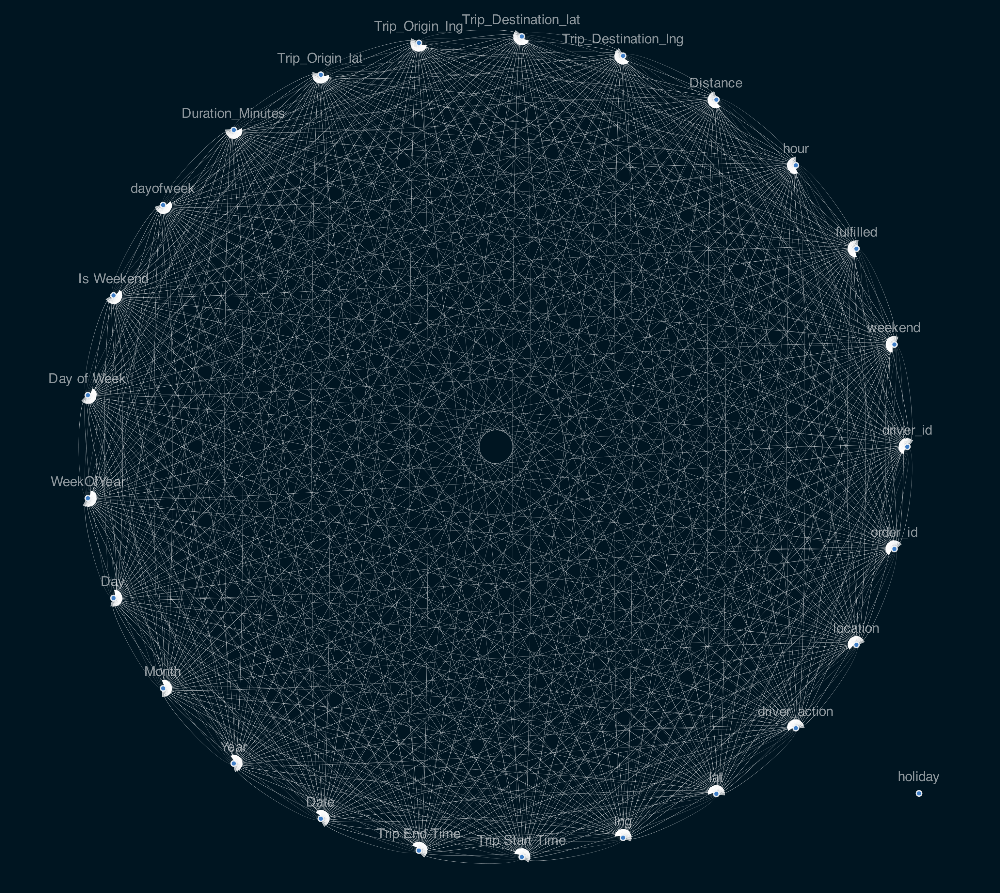

In [22]:

viz = plot_structure(
    sm,
    graph_attributes={"scale": "0.5"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)
filename = "./structure_model.png"
viz.draw(filename)
Image(viz.draw(
    format="png", prog="circo"  # `circo` produces a circular layout
),width=500)

In [56]:
sm_enh = from_pandas(sample_df, tabu_edges=[("Distance","location")],
tabu_parent_nodes=["driver_action"],tabu_child_nodes=["Date","hour"], w_threshold=0.7)


In [57]:
sm_enh.edges

OutEdgeView([('Trip Start Time', 'order_id'), ('Trip Start Time', 'driver_id'), ('Trip Start Time', 'Year'), ('Trip End Time', 'order_id'), ('Trip End Time', 'driver_id'), ('Trip End Time', 'Year'), ('Date', 'order_id'), ('Date', 'driver_id'), ('Date', 'Year'), ('Year', 'order_id'), ('Year', 'driver_id'), ('WeekOfYear', 'order_id'), ('Duration_Minutes', 'order_id'), ('Duration_Minutes', 'driver_id'), ('hour', 'order_id'), ('location', 'order_id')])

In [37]:
# sample_df1=sample_df.copy()
# sample_df1.columns

In [31]:
# sample_df1.drop(columns=["Day of Week","lat","lng"],inplace=True)

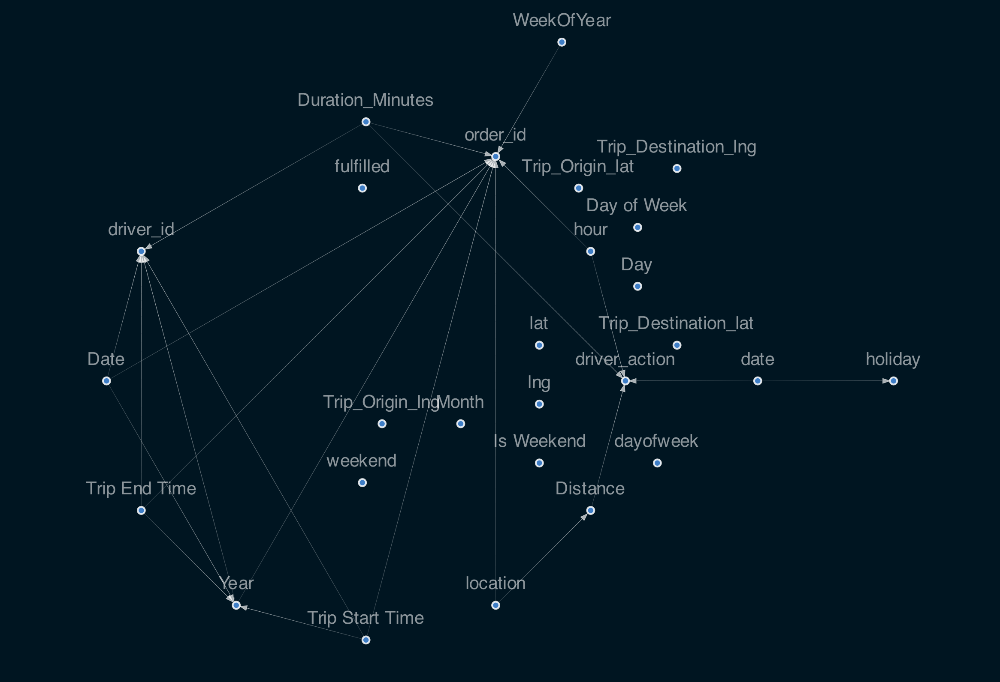

In [30]:
viz = plot_structure(
    sm_enh,
    graph_attributes={"scale": "0.5"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK,
    prog='fdp'
)
Image(viz.draw(
    format="png", prog="circo"  # `circo` produces a circular layout
),width=800)


`drop some unnessessary columns for the structure`

In [ ]:
sm_enh.remove_edge("Distance", "driver_action")
sm_enh.remove_edge("date", "driver_action")
sm_enh.remove_edge("date", "holiday")
sm_enh.remove_edge("hour", "driver_action")
sm_enh.remove_edge("location", "Distance")
sm_enh.remove_edge("Duration_Minutes", "driver_action")
sm_enh.remove_edge("Distance", "driver_action")
sm_enh.remove_edge("Distance","fulfilled")


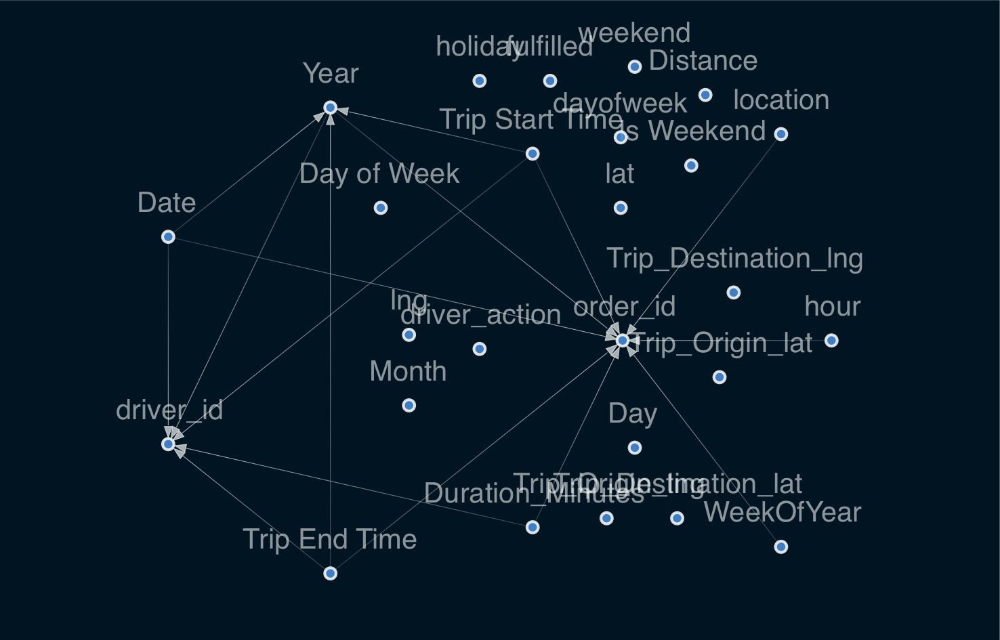

In [60]:
viz = plot_structure(
    sm_enh,
    graph_attributes={"scale": "0.5"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK,
    prog='fdp'
)
Image(viz.draw(
    format="jpg", prog="circo"  # `circo` produces a circular layout
),width=1000)

In [44]:
sample_df.columns


Index(['order_id', 'driver_id', 'driver_action', 'lat', 'lng',
       'Trip Start Time', 'Trip End Time', 'Date', 'Year', 'Month', 'Day',
       'WeekOfYear', 'Day of Week', 'Is Weekend', 'dayofweek',
       'Duration_Minutes', 'Trip_Origin_lat', 'Trip_Origin_lng',
       'Trip_Destination_lat', 'Trip_Destination_lng', 'Distance', 'hour',
       'fulfilled', 'holiday', 'weekend', 'location'],
      dtype='object')

In [61]:
cleaned_driver_loc=sample_df[["Trip_Destination_lat","Trip_Destination_lng"]]
cleaned_request_loc=sample_df[["Trip_Origin_lat","Trip_Origin_lng"]]

In [62]:
from sklearn.cluster import KMeans

kmeans = KMeans(
    init="random",
    n_clusters=50,
    n_init=10,
    max_iter=300,
    random_state=42
)
# do clustering
kmeans.fit(cleaned_request_loc)
# save results
cleaned_request_labels = kmeans.labels_

# do clustering
kmeans.fit(cleaned_driver_loc)
# save results
cleaned_driver_labels = kmeans.labels_

`Get largest subgraph`


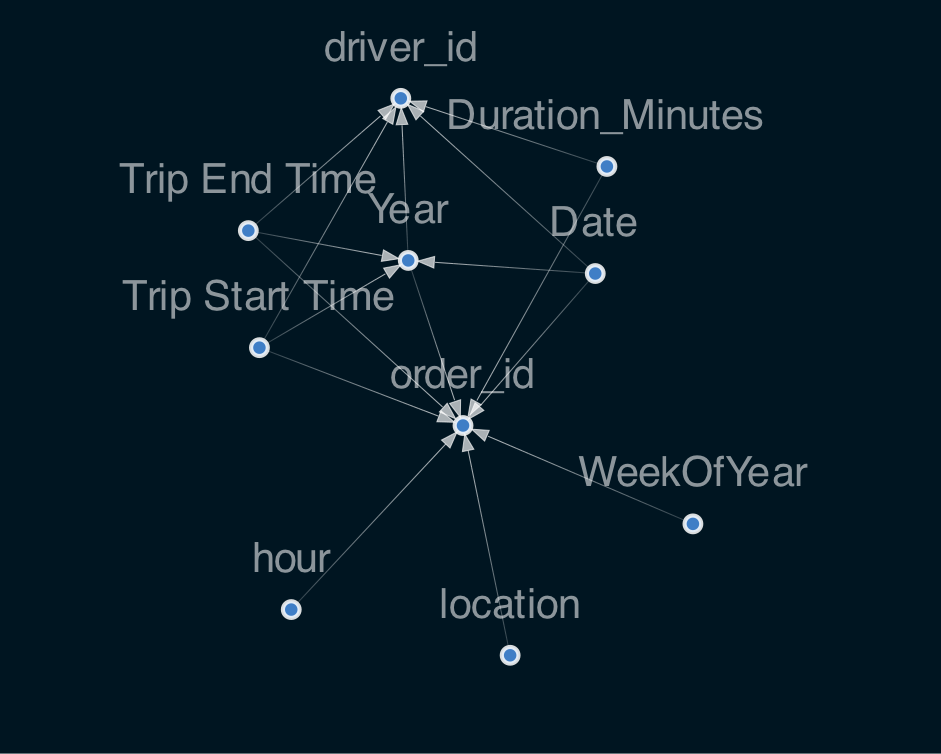

In [68]:
sm_enhanced = sm_enh.get_largest_subgraph()
viz = plot_structure(
    sm_enhanced,
    graph_attributes={"scale": "0.7","fontsize":"small"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK,
)
Image(viz.draw(format='png'),width=1000)

In [7]:
# bn = BayesianNetwork(sm_enhanced)

In [77]:
from causalnex.discretiser import Discretiser

discretised_data = sample_df.copy()

discretised_data["duration_min"] = Discretiser(method="fixed",
                          numeric_split_points=[10]).transform(discretised_data["Duration_Minutes"].values)
discretised_data["distance_diff"] = Discretiser(method="fixed",
                          numeric_split_points=[5]).transform(discretised_data["Distance"].values)
discretised_data["month"] = Discretiser(method="fixed",
                          numeric_split_points=[4,8]).transform(discretised_data["Month"].values)
discretised_data["day"] = Discretiser(method="fixed",
                          numeric_split_points=[10,20]).transform(discretised_data["Day"].values)
discretised_data["minute"] = Discretiser(method="fixed",
                          numeric_split_points=[30]).transform(discretised_data["Duration_Minutes"].values)
discretised_data["hour"] = Discretiser(method="fixed",
                          numeric_split_points=[8,16]).transform(discretised_data["hour"].values)

In [13]:
train, test = train_test_split(sample_df, train_size=0.9, test_size=0.1, random_state=7)

In [86]:
print(f"The ground truth is '{discretised_data.loc[18, 'fulfilled']}'")

The ground truth is 'yes'


`Machiene learning Model`

train, test = train_test_split(discretised_data, train_size=0.9, test_size=0.1, random_state=7)

In [18]:
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
X = sample_df.drop(columns=['fulfilled'], axis=1)
y = sample_df['fulfilled']
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=123)
pipeline = Pipeline(steps=[
    ('regressor', RandomForestRegressor(n_estimators=12, random_state=42))
])
model = pipeline.fit(X_train, y_train)

In [19]:
val_accuracy = model.score(X_test, y_test)
val_accuracy#output 1.0

1.0

We can see that the validation accuracy is 1.0 which means that the model is overfitting.